In [344]:
import pandas as pd
import pyod as py
from sklearn.preprocessing import StandardScaler
from pretty_confusion_matrix import pp_matrix_from_data
import plotly.express as px
import matplotlib.pyplot as plt
import pickle

In [9]:
time = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/Timestamps.csv')

In [172]:
from pyod.models.pca import PCA

In [173]:
model=PCA(contamination=0.1)

In [348]:
filename = 'pca.sav'
pickle.dump(model, open(filename, 'wb'))

In [346]:
model = pickle.load(open(filename, 'rb'))

In [250]:
df = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [251]:
df

,Unnamed: 0,Node 11,Link 21,Link 22,Pressure 10
0,0,-0.560490,8.324737,2.527433,0.193668
1,1,-0.560490,9.043777,1.537900,0.205012
2,2,-0.840344,9.043777,1.537900,0.217237
3,3,-0.840344,9.762817,1.537900,0.229711
4,4,-0.840344,9.762817,1.537900,0.241821
...,...,...,...,...,...
17515,17515,0.558925,-0.303745,-0.441167,0.671786
17516,17516,-0.000783,0.415295,-0.441167,0.711009
17517,17517,-0.000783,-0.303745,-0.441167,0.735842
17518,17518,-0.000783,0.415295,-0.441167,0.768762


on train le model sur le scénario 506 

In [252]:
y_train = model.predict(df) 

In [253]:
y_train=pd.DataFrame(y_train)
y_train

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


on convertit en time serie

In [254]:

y_train.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_train

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [255]:
y_train.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/pred_data.csv')
y_train = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

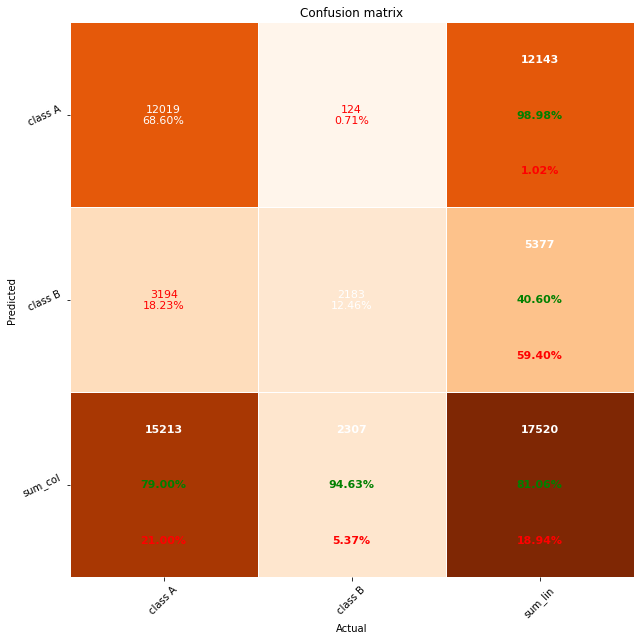

In [256]:
pp_matrix_from_data (y_train['0'],y["Label"])

In [257]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [258]:
fig = px.line(y_train.reset_index(), x='timestamp', y='0', title='Anomaly pred')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

résultat assez satisfaisant , on remarque que les anomalies sont bien prédites surtout au début de la fuite ,
avant les anomalies detectées ne durent pas plus d'un jour
à partir de la fin de fuite, les anomalies sont très peu présentes

prediction sur scénario 505 abrupt mais avec 20% de perte 

In [268]:
test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [269]:
y_test = model.fit_predict(test)

C:\Users\cjoly\Anaconda3\envs\newpycaret\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning:

Function fit_predict is deprecated



In [270]:
y_test

array([0, 0, 0, ..., 0, 0, 0])

In [271]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,0
1,0
2,0
3,0
4,0
...,...
17515,0
17516,0
17517,0
17518,0


In [272]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,0
1,2017-01-01 00:30:00,0
2,2017-01-01 01:00:00,0
3,2017-01-01 01:30:00,0
4,2017-01-01 02:00:00,0
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [273]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [274]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [275]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

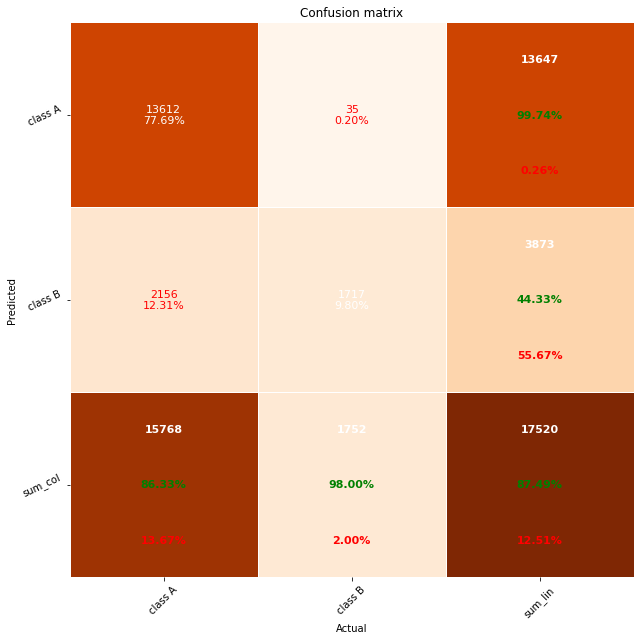

In [276]:
pp_matrix_from_data(y_test['0'],y['Label'])

on a un super résultat !

prediction sur scénario 5 abrupt avec 5%
a noter que pour ce scénario le dataset est beaucoup plus corrélé qu'avant, voir si avec df_full c'est plus efficace sur tout les scénario 

In [278]:
x = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [279]:
y.describe()

,Unnamed: 0,Index,Label
count,17520.000000,17520.000000,17520.000000
mean,8759.500000,8760.500000,0.053653
std,5057.732694,5057.732694,0.225338
min,0.000000,1.000000,0.000000
25%,4379.750000,4380.750000,0.000000
50%,8759.500000,8760.500000,0.000000
75%,13139.250000,13140.250000,0.000000
max,17519.000000,17520.000000,1.000000


In [280]:
y_test = model.predict(x)

In [281]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [282]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [283]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [284]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [285]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [286]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

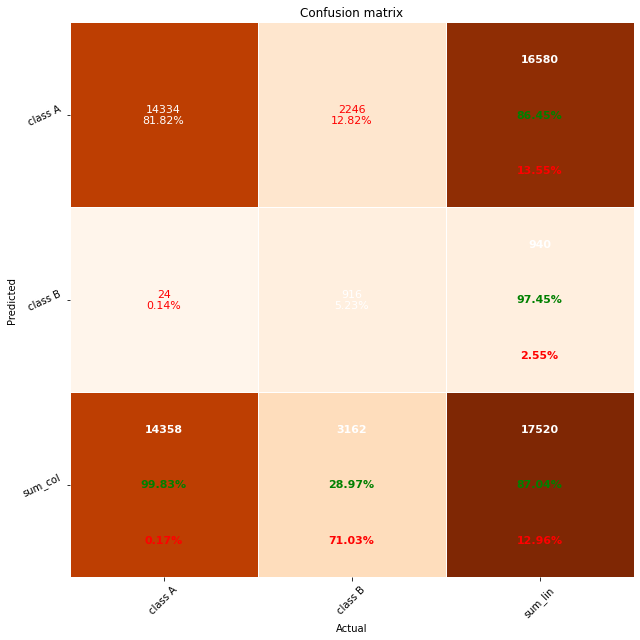

In [287]:
pp_matrix_from_data(y_test['0'],y['Label'])

on detecte beaucoup de fausse anomalies, idée : entrainer model sur scénario avec moins de fuite car l'important ici est de detecter le début d'une fuite pas toute la fuite
donc on pourrais voir si modèle a 15% réduit les fausses anomalie tout en prédisant aussi bien le début des fuites

essaye sur scénario 4 sans fuite 

In [288]:
x_4 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [289]:
y_test = model.predict(x_4)

In [290]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [291]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [292]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [293]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [294]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [295]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

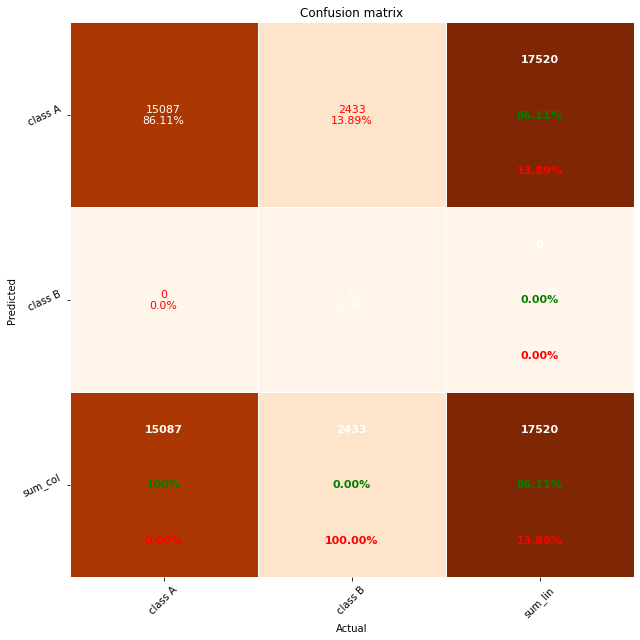

In [296]:
pp_matrix_from_data(y_test['0'],y['Label'])

on a 30% de fausse cependant quand on regarde plus précisement les prédictions, on a rarement plus d'un jour de prédis anormal.
introduire un seuil de de X h (12h par exemple) prédites anormales d'affilée peut permettre aux techniciens de moins se déplacer 

scénario 507 incipient avec 30%

In [315]:
x_507 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-507/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-507/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [316]:
y.describe()

,Unnamed: 0,Index,Label
count,17520.000000,17520.000000,17520.000000
mean,8759.500000,8760.500000,0.337386
std,5057.732694,5057.732694,0.472831
min,0.000000,1.000000,0.000000
25%,4379.750000,4380.750000,0.000000
50%,8759.500000,8760.500000,0.000000
75%,13139.250000,13140.250000,1.000000
max,17519.000000,17520.000000,1.000000


In [317]:
y_test = model.predict(x_507)

In [318]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [319]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [320]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [321]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-507/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-507/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [322]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [323]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

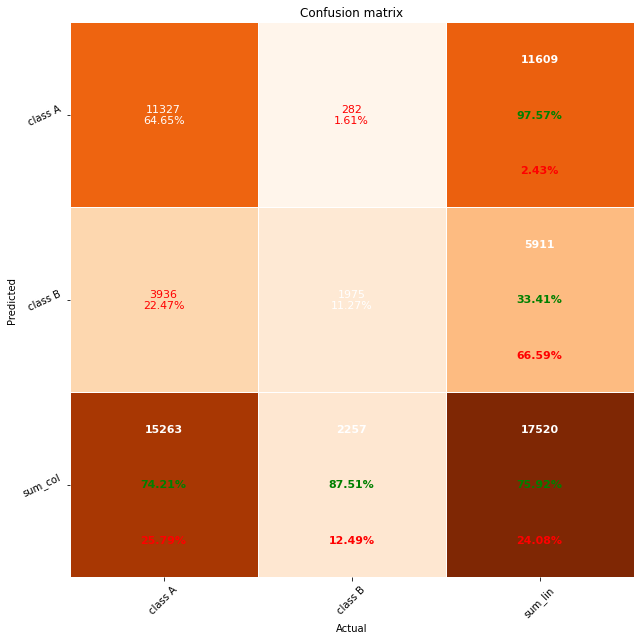

In [324]:
pp_matrix_from_data(y_test['0'],y['Label'])

algo detecte bien debut de fuite, c'est peut etre le cas le plus complexe
question : notre algo estime que ya toujours 30% de fuite, est ce que ca marcherais aussi bien 

scénario 1 70 incipient

In [325]:
x_1 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-1/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-1/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [330]:
y.describe()

,Unnamed: 0,Index,Label
count,17520.000000,17520.000000,17520.000000
mean,8759.500000,8760.500000,0.687272
std,5057.732694,5057.732694,0.463618
min,0.000000,1.000000,0.000000
25%,4379.750000,4380.750000,0.000000
50%,8759.500000,8760.500000,1.000000
75%,13139.250000,13140.250000,1.000000
max,17519.000000,17520.000000,1.000000


In [326]:
y_test = model.predict(x_1)

In [327]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [328]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [329]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [331]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-1/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-1/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [332]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [333]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

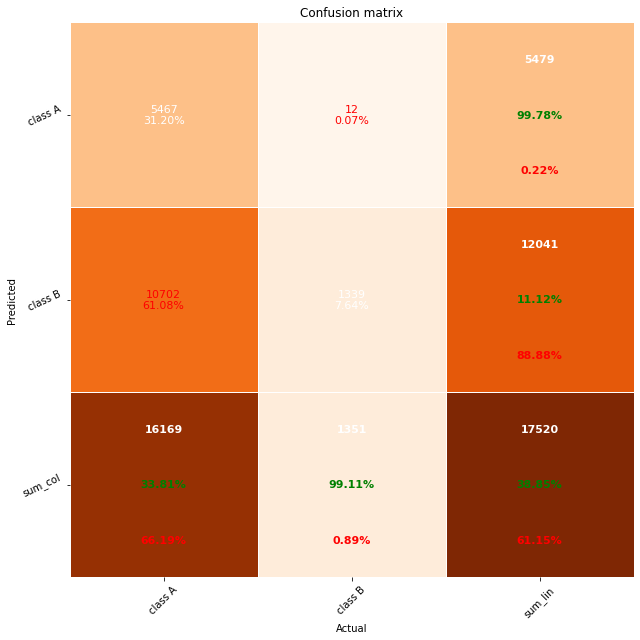

In [334]:
pp_matrix_from_data(y_test['0'],y['Label'])

scénario 3, 2 fuites incipient 

In [306]:
x_3 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [307]:
y_test = model.predict(x_3)

In [308]:
y_test

array([0, 1, 1, ..., 0, 0, 0])

In [309]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,0
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [310]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,0
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [311]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [312]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [313]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

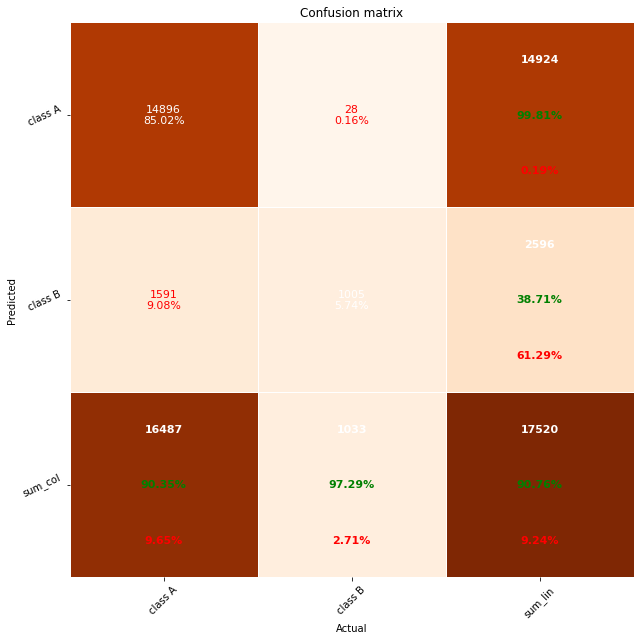

In [239]:
pp_matrix_from_data(y_test['0'],y['Label'])